In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import networkx as nx
from pathlib import Path
import pandas as pd

from neural_reconstruction.algorithms.fragment_linking.linker import HierarchicalFragmentLinker
from neural_reconstruction.core.preprocessing import SkinAnalysisPipeline
from neural_reconstruction.core.topology import TopologyBuilder
from neural_reconstruction.core.pathfinding import PathFinder
from neural_reconstruction.algorithms.fragment_linking.utils import compute_vector_angle,is_direction_too_similar

import skimage as ski
# from skimage.measure import label
# from skimage.restoration import rolling_ball
from scipy.spatial import KDTree

from xgboost import XGBClassifier
import joblib


In [2]:
BASE_PATH = Path('/home/pony/projects/ienf_q/')
IMAGE_ID = 'S1616-2_a'
BASE_PATH = BASE_PATH / f'nas/jia/data_0320/{IMAGE_ID}'
XGB_PROBA_THRESHOLD = 0.4


FEATURES = [
    'distance',"path_length","path_cost", 'normalized_cost', 'tortuosity',
    'mean_intensity', 'max_intensity', 'min_intensity', 'median_intensity',
    'std_intensity', 'intensity_q25', 'intensity_q75',
    'frac_bright', 'endpoint_intensity', 'max_deviation',
]

In [3]:
image      = cv2.imread(f'{BASE_PATH}/image.png',      cv2.IMREAD_COLOR_RGB)[:, :, 1]  # 只取綠色通道
mask       = cv2.imread(f'{BASE_PATH}/mask.png',       cv2.IMREAD_GRAYSCALE)
annotation = cv2.imread(f'{BASE_PATH}/weka.png', cv2.IMREAD_GRAYSCALE)

print(f'image      shape: {image.shape},      dtype: {image.dtype}')
print(f'mask       shape: {mask.shape},       dtype: {mask.dtype}')
print(f'annotation shape: {annotation.shape}, dtype: {annotation.dtype}')

# _, axes = plt.subplots(3, 1, figsize=(18, 6), constrained_layout=True)
# axes[0].imshow(image,      cmap='gray');  axes[0].set_title('Image');       axes[0].axis('off')
# axes[1].imshow(mask,       cmap='gray');  axes[1].set_title('Mask');        axes[1].axis('off')
# axes[2].imshow(annotation, cmap='gray');  axes[2].set_title('Annotation');  axes[2].axis('off')
# plt.show()

image      shape: (2048, 7577),      dtype: uint8
mask       shape: (2048, 7577),       dtype: uint8
annotation shape: (2048, 7577), dtype: uint8


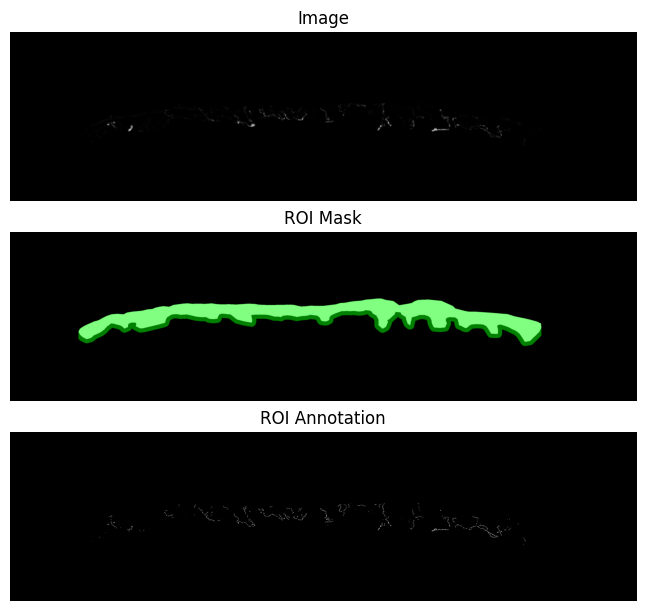

In [ ]:
from neural_reconstruction.core.preprocessing import dilate_epidermis_vertically

roi_mask = dilate_epidermis_vertically(mask, offset_px=50)
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (51, 51))
background = cv2.morphologyEx(image, cv2.MORPH_OPEN, kernel)
image = cv2.subtract(image, background)

roi_image = cv2.bitwise_and(image, image, mask=roi_mask)
roi_annotation = cv2.bitwise_and(annotation, annotation, mask=roi_mask)

# apply opening to roi_annotation to remove small noise
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
roi_annotation = cv2.morphologyEx(roi_annotation, cv2.MORPH_OPEN, kernel)

# apply closing to roi_annotation to fill small holes
roi_annotation = cv2.morphologyEx(roi_annotation, cv2.MORPH_CLOSE, kernel)


viz_mask = cv2.cvtColor(roi_mask, cv2.COLOR_GRAY2RGB)
viz_mask[:, :, 0] = 0  # 去掉紅色通道
viz_mask[:, :, 2] = 0  # 去掉藍色通道
viz_mask = cv2.addWeighted(viz_mask, 0.5, cv2.cvtColor(mask, cv2.COLOR_GRAY2RGB), 0.5, 0)
_, axes = plt.subplots(3, 1, figsize=(18, 6), constrained_layout=True)
axes[0].imshow(roi_image,      cmap='gray');  axes[0].set_title('Image');           axes[0].axis('off')
axes[1].imshow(viz_mask);  axes[1].set_title('ROI Mask');                           axes[1].axis('off')
axes[2].imshow(roi_annotation, cmap='gray');  axes[2].set_title('ROI Annotation');  axes[2].axis('off')
plt.show()

In [5]:
labeled = np.asarray(ski.measure.label(roi_annotation, connectivity=2))

topology_builder = TopologyBuilder(segment_length=3.0)
seed_graph = topology_builder.build_seed_graph(roi_annotation, roi_image)

for node in seed_graph.nodes():
    y, x = node
    seed_graph.nodes[node]["component_id"] = int(labeled[int(y), int(x)])

# 為種子圖的邊設置低成本
for u, v, data in seed_graph.edges(data=True):
    data["weight"] = 1e-5

/home/pony/projects/ienf_q/src/neural_reconstruction/core/topology/topology_builder.py:104: VisibleDeprecationWarning: separator in column name will change to _ in version 0.13; to silence this warning, use `separator='-'` to maintain current behavior and use `separator='_'` to switch to the new default behavior.
  summary = summarize(skel_obj)


In [6]:
FIRST_SEARCH_RADIUS = 50
SECOND_SEARCH_RADIUS = 50

topology_points = np.array(list(seed_graph.nodes()))
kdtree = KDTree(topology_points)

cost_map = ((255 - roi_image.astype(np.float64)) / 255)**2
seed_map = np.zeros_like(cost_map, dtype=bool)
for p in topology_points:
    seed_map[p[0], p[1]] = True

path_finder = PathFinder(cost_map)
topology_points = np.array(list(seed_graph.nodes()))
path_lookup = path_finder.find_paths_from_seeds(
    topology_points=topology_points,
    kdtree=kdtree,
    search_radius=max(FIRST_SEARCH_RADIUS, SECOND_SEARCH_RADIUS),
    seed_map=seed_map,
    label_img=labeled,
)

In [7]:
path_with_features = {}
for (u, v), (path, cost) in path_lookup.items():
    path_pts = np.array(path)
    distance = float(np.linalg.norm(np.array(u) - np.array(v)))

    path_length = float(np.sum(np.linalg.norm(np.diff(path_pts, axis=0), axis=1)))
    normalized_cost = float(cost / max(path_length, 1e-8))
    
    intensities = roi_image[path_pts[:, 0], path_pts[:, 1]].astype(np.float32)

    # Max perpendicular deviation from the straight line connecting endpoints
    start, end = path_pts[0].astype(float), path_pts[-1].astype(float)
    line_vec = end - start
    line_len = np.linalg.norm(line_vec)
    if line_len > 0:
        max_deviation = float(np.max(np.abs(np.cross(line_vec / line_len, path_pts - start))))
    else:
        max_deviation = 0.0

    path_with_features[u,v] = {
            "path": path,
            "distance": distance,
            "path_length": path_length,
            "path_cost": cost,
            "normalized_cost": normalized_cost,
            "tortuosity" : path_length / max(distance, 1e-8),
            'mean_intensity':     float(np.mean(intensities)),
            'max_intensity':      float(np.max(intensities)),
            'min_intensity':      float(np.min(intensities)),
            'median_intensity':   float(np.median(intensities)),
            'std_intensity':      float(np.std(intensities)),
            'intensity_q25':      float(np.percentile(intensities, 25)),
            'intensity_q75':      float(np.percentile(intensities, 75)),
            'frac_bright':        float(np.mean(intensities > 127)),
            'endpoint_intensity': float((intensities[0] + intensities[-1]) / 2),
            'max_deviation':      max_deviation,
        }
    

/tmp/ipykernel_771113/3158484229.py:16: DeprecationWarning: Arrays of 2-dimensional vectors are deprecated. Use arrays of 3-dimensional vectors instead. (deprecated in NumPy 2.0)
  max_deviation = float(np.max(np.abs(np.cross(line_vec / line_len, path_pts - start))))


In [8]:
model = XGBClassifier()
model.load_model('./xgb_connection_filter.json')
loaded_scaler = joblib.load('./scaler.joblib')


In [9]:
filtered_path_lookup = {}

accepted_edges_count = 0
total_edges_count = len(path_with_features)
for (u, v), features in path_with_features.items():
    s = pd.DataFrame([{k: features[k] for k in FEATURES}])[FEATURES]
    s = loaded_scaler.transform(s.values)
    prob = model.predict_proba(s)[0, 1]
    if prob < XGB_PROBA_THRESHOLD:  # threshold can be tuned
        continue

    accepted_edges_count += 1
    enhance_weight = ( 1 - prob ) * features['path_cost']
    filtered_path_lookup[(u, v)] = (features['path'], enhance_weight)
print(f"Accepted {accepted_edges_count} out of {total_edges_count} edges after filtering with XGBoost classifier.")

Accepted 6207 out of 19250 edges after filtering with XGBoost classifier.


In [10]:
endpoints = {node for node in seed_graph.nodes() if seed_graph.degree(node) == 1}
new_edges = []


FIRST_WEIGHT_DISCOUNT = 0.8


for endpoint in endpoints:
    # 1. 取得端點的唯一鄰居，計算延伸方向
    neighbors = list(seed_graph.neighbors(endpoint))
    if len(neighbors) != 1:
        continue

    neighbor = neighbors[0]
    extend_vector = np.array(endpoint) - np.array(neighbor)

    # 2. KDTree 查詢候選節點
    endpoint_arr = np.array(endpoint)
    candidate_indices = kdtree.query_ball_point(endpoint_arr, r=FIRST_SEARCH_RADIUS)

    # 3. 計算每個候選的距離並排序（從近到遠）
    candidates_with_dist = []
    for idx in candidate_indices:
        candidate = tuple(topology_points[idx])

        if candidate == endpoint or candidate == neighbor:
            continue

        if seed_graph.has_edge(endpoint, candidate):
            continue

        dist = np.linalg.norm(topology_points[idx] - endpoint_arr)
        candidates_with_dist.append((candidate, dist, idx))

    candidates_with_dist.sort(key=lambda x: x[1])

    # 4. 評估候選節點
    selected_directions = []
    best_candidate = None
    best_cost = float("inf")
    best_path = None

    for candidate, dist, idx in candidates_with_dist:
        key1 = (endpoint, candidate)
        key2 = (candidate, endpoint)

        if key1 in filtered_path_lookup:
            path, base_cost = filtered_path_lookup[key1]
        elif key2 in filtered_path_lookup:
            path, base_cost = filtered_path_lookup[key2]
        else:
            continue

        # 4.1 計算 AC 向量
        ac_vector = np.array(candidate) - endpoint_arr

        # 4.2 檢查方向是否與已通過篩選的候選方向太相近
        if is_direction_too_similar(ac_vector, selected_directions, 5):
                continue

        # 4.3 通過篩選，加入方向清單
        selected_directions.append(ac_vector)

        # 4.4 計算夾角
        angle = compute_vector_angle(extend_vector, ac_vector)

        if angle > 75:
            continue


        # 計算路徑長度
        path_arr = np.array(path)
        diffs = np.diff(path_arr, axis=0)
        segment_dists = np.linalg.norm(diffs, axis=1)
        path_length = np.sum(segment_dists)

        # 歸一化成本
        normalized_cost = 0.8 * base_cost / path_length + 0.2 * (
            dist / 20
        )

        # 角度懲罰
        penalty = 0.5 * (angle / 75)
        final_cost = normalized_cost * (1 + penalty) / (1 + 0.5)

        # 更新最佳候選
        if final_cost < best_cost:
            best_cost = final_cost
            best_candidate = candidate
            best_path = path

    
    if best_candidate is not None:
        new_edges.append((endpoint, best_candidate, best_cost, best_path))

first_step_graph = seed_graph.copy()
for endpoint, target, cost, path in new_edges:
    if not first_step_graph.has_edge(endpoint, target):
        first_step_graph.add_edge(
            endpoint, target, weight=cost * FIRST_WEIGHT_DISCOUNT, path=path, phase=1
        )

In [11]:
def draw_mst_on_ax(ax, background, mst_forest, edge_color='lime', node_color='cyan',
                   linewidth=1, node_size=1.2, show_nodes=True):
    ax.imshow(background, cmap='gray' if background.ndim == 2 else None)
    for u, v, data in mst_forest.edges(data=True):
        path = data.get('path', [u, v])
        if len(path) < 2:
            continue
        ax.plot([p[1] for p in path], [p[0] for p in path],
                color=edge_color, linewidth=linewidth, alpha=0.85)
    if show_nodes:
        for node in mst_forest.nodes():
            ax.plot(node[1], node[0], '.', color=node_color, markersize=node_size)



# fig, axes = plt.subplots(1, 1, figsize=(128, 128), constrained_layout=True)
# draw_mst_on_ax(axes, image, first_step_graph,linewidth=2, node_size=2)
# draw_mst_on_ax(axes, image, seed_graph, edge_color='red', linewidth=2, node_size=2)
# axes.axis('off')
# plt.show()

In [12]:
endpoints = [node for node in first_step_graph.nodes() if first_step_graph.degree(node) == 1]
isolated = [node for node in first_step_graph.nodes() if not any(True for _ in first_step_graph.neighbors(node))]

candidate_edges = []

DISTANCE_WEIGHT = 0.3
ANGLE_PENALTY_WEIGHT = 0.5
MAX_ANGLE_DEGREES = 60
MAX_COST_THRESHOLD = 0.5

# --- 端點延伸（有方向資訊，使用完整角度限制）---
for endpoint in endpoints:
    neighbors = list(first_step_graph.neighbors(endpoint))
    if len(neighbors) != 1:
        continue

    neighbor = neighbors[0]
    extend_vector = np.array(endpoint) - np.array(neighbor)

    endpoint_arr = np.array(endpoint)
    candidate_indices = kdtree.query_ball_point(endpoint_arr, r=SECOND_SEARCH_RADIUS)

    for candidate_idx in candidate_indices:
        target_node = tuple(topology_points[candidate_idx])

        if target_node == endpoint or target_node == neighbor:
            continue

        if first_step_graph.has_edge(endpoint, target_node):
            continue

        ac_vector = np.array(target_node) - endpoint_arr
        distance = np.linalg.norm(ac_vector)
        angle = compute_vector_angle(extend_vector, ac_vector)

        if angle > MAX_ANGLE_DEGREES:
            continue

        # 查找路徑
        path = None
        base_cost = None

        if (endpoint, target_node) in filtered_path_lookup:
            path, base_cost = filtered_path_lookup[(endpoint, target_node)]
        elif (target_node, endpoint) in filtered_path_lookup:
            path, base_cost = filtered_path_lookup[(target_node, endpoint)]
        else:
            continue

        # 計算路徑長度
        path_arr = np.array(path)
        diffs = np.diff(path_arr, axis=0)
        segment_dists = np.linalg.norm(diffs, axis=1)
        path_length = np.sum(segment_dists)

        # 計算最終成本
        distance_penalty = distance / SECOND_SEARCH_RADIUS
        normalized_cost = (
            1 - DISTANCE_WEIGHT
        ) * base_cost / path_length + DISTANCE_WEIGHT * distance_penalty
        angle_penalty = ANGLE_PENALTY_WEIGHT * (angle / 180.0)

        final_cost = (
            normalized_cost * (1 + angle_penalty) / (1 + ANGLE_PENALTY_WEIGHT)
        )

        if final_cost <= MAX_COST_THRESHOLD:
            candidate_edges.append((endpoint, target_node, final_cost, path))

# --- 孤立節點延伸（無方向資訊，搜尋半徑減半，不做角度限制）---
isolated_search_radius = SECOND_SEARCH_RADIUS / 2.0

for node in isolated:
    node_arr = np.array(node)
    candidate_indices = kdtree.query_ball_point(node_arr, r=isolated_search_radius)

    for candidate_idx in candidate_indices:
        target_node = tuple(topology_points[candidate_idx])

        if target_node == node:
            continue

        if first_step_graph.has_edge(node, target_node):
            continue

        ac_vector = np.array(target_node) - node_arr
        distance = np.linalg.norm(ac_vector)

        # 查找路徑
        path = None
        base_cost = None

        if (node, target_node) in filtered_path_lookup:
            path, base_cost = filtered_path_lookup[(node, target_node)]
        elif (target_node, node) in filtered_path_lookup:
            path, base_cost = filtered_path_lookup[(target_node, node)]
        else:
            continue

        # 計算路徑長度
        path_arr = np.array(path)
        diffs = np.diff(path_arr, axis=0)
        segment_dists = np.linalg.norm(diffs, axis=1)
        path_length = np.sum(segment_dists)

        # 無角度懲罰
        distance_penalty = distance / isolated_search_radius
        final_cost = (
            (1 - DISTANCE_WEIGHT) * base_cost / path_length
            + DISTANCE_WEIGHT * distance_penalty
        )

        if final_cost <= MAX_COST_THRESHOLD:
            candidate_edges.append((node, target_node, final_cost, path))


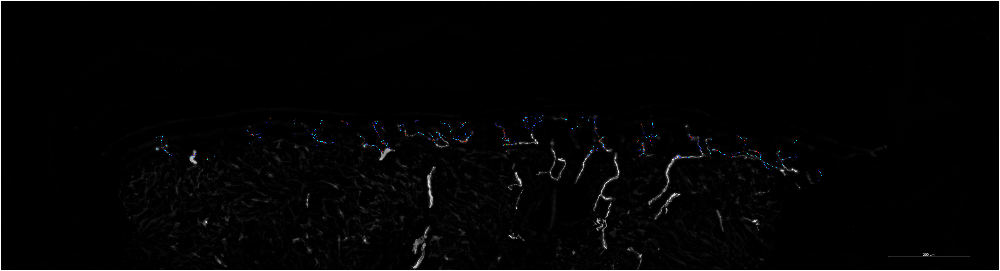

In [13]:
second_graph = first_step_graph.copy()
for u, v, cost, path in candidate_edges:
    if not second_graph.has_edge(u, v):
        second_graph.add_edge(u, v, weight=cost, path=path, phase=2)
fig, axes = plt.subplots(1, 1, figsize=(128, 128), constrained_layout=True)

draw_mst_on_ax(axes, image, second_graph,linewidth=2, node_size=2)
draw_mst_on_ax(axes, image, first_step_graph, edge_color='red', linewidth=2, node_size=2)
draw_mst_on_ax(axes, image, seed_graph, edge_color='blue', linewidth=2, node_size=2)
axes.axis('off')
plt.show()


In [14]:
mst_forest = nx.minimum_spanning_tree(second_graph, weight="weight")


In [15]:
MIN_COMPONENT_LENGTH = 10.0  # pixels

def filter_short_components(graph: nx.Graph, min_length: float) -> nx.Graph:
    """過濾掉總路徑長度小於 min_length 的連通元件"""
    nodes_to_remove = []
    for component_nodes in nx.connected_components(graph):
        subgraph = graph.subgraph(component_nodes)
        total_length = 0.0
        for u, v, data in subgraph.edges(data=True):
            path = data.get('path',[])
            if len(path) >= 2:
                pts = np.array(path)
                total_length += float(np.sum(np.linalg.norm(np.diff(pts, axis=0), axis=1)))
            else:
                total_length += float(np.linalg.norm(np.array(u) - np.array(v)))
        if total_length < min_length:
            nodes_to_remove.extend(component_nodes)

    filtered = mst_forest.copy()
    filtered.remove_nodes_from(nodes_to_remove)
    return filtered

small_tree_filtered = filter_short_components(mst_forest, MIN_COMPONENT_LENGTH)
print(f"After filtering short components (< {MIN_COMPONENT_LENGTH} px): "
      f"nodes={small_tree_filtered.number_of_nodes()}, edges={small_tree_filtered.number_of_edges()}")

After filtering short components (< 10.0 px): nodes=2577, edges=2491


In [16]:
res_graph = small_tree_filtered

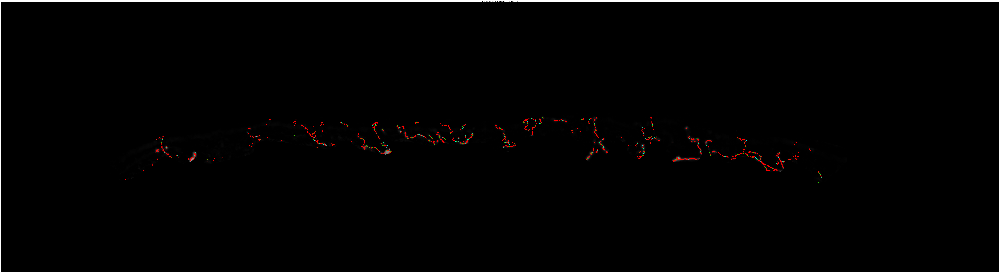

In [17]:
fig, axes = plt.subplots(1, 1, figsize=(128, 128), constrained_layout=True)

viz_image = cv2.cvtColor(roi_image, cv2.COLOR_GRAY2RGB)
viz_image[roi_annotation > 0] = [255, 0, 0]
draw_mst_on_ax(axes, viz_image, res_graph)
axes.set_title(f'Pure MST Reconstruction  (nodes={res_graph.number_of_nodes()}, edges={res_graph.number_of_edges()})')
axes.axis('off')

plt.show()

In [18]:
from neural_reconstruction.core.topology import TopologyBuilder
from neural_reconstruction.core.evaluation import extract_graph_points, compute_average_hausdorff_distance

# 從 label.png 建構 GT 拓樸
label_img = cv2.imread(f'{BASE_PATH / "label.png"}', cv2.IMREAD_GRAYSCALE)

gt_builder = TopologyBuilder()
roi_label = cv2.bitwise_and(label_img, label_img, mask=roi_mask)
gt_graph = gt_builder.build_seed_graph(roi_label)

print(f'GT  — Nodes: {gt_graph.number_of_nodes()}, Edges: {gt_graph.number_of_edges()}')
print(f'Pred — Nodes: {res_graph.number_of_nodes()}, Edges: {res_graph.number_of_edges()}')

# 展開成點集（nodes + edge path 上的所有點）
pred_points = extract_graph_points(res_graph)
gt_points   = extract_graph_points(gt_graph)

print(f'\nPoint count after expanding edge paths:')
print(f'  Pred: {len(pred_points)} pts')
print(f'  GT  : {len(gt_points)} pts')

GT  — Nodes: 2630, Edges: 2582
Pred — Nodes: 2577, Edges: 2491

Point count after expanding edge paths:
  Pred: 8211 pts
  GT  : 6894 pts


/home/pony/projects/ienf_q/src/neural_reconstruction/core/topology/topology_builder.py:104: VisibleDeprecationWarning: separator in column name will change to _ in version 0.13; to silence this warning, use `separator='-'` to maintain current behavior and use `separator='_'` to switch to the new default behavior.
  summary = summarize(skel_obj)


In [19]:
avg_dist, d_pred_to_gt, d_gt_to_pred = compute_average_hausdorff_distance(
    pred_points, gt_points
)

print('=== Average Hausdorff Distance ===')
print(f'Avg Hausdorff Distance : {avg_dist:.4f} px')
print(f'  Pred → GT            : {d_pred_to_gt:.4f} px')
print(f'  GT   → Pred          : {d_gt_to_pred:.4f} px')

=== Average Hausdorff Distance ===
Avg Hausdorff Distance : 7.7062 px
  Pred → GT            : 11.9763 px
  GT   → Pred          : 3.4361 px


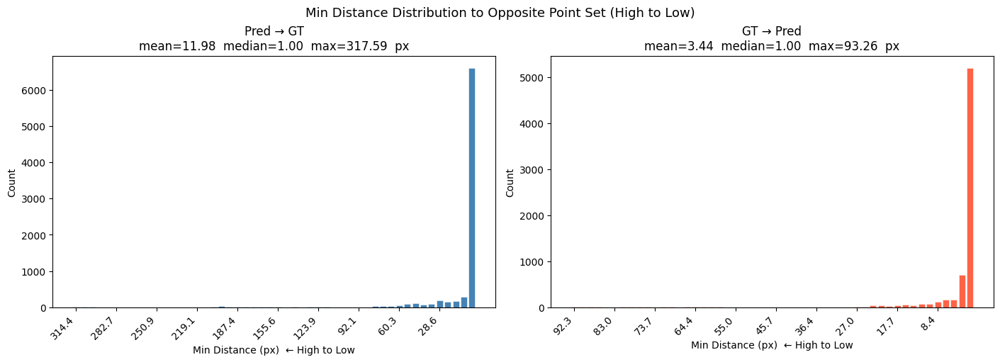

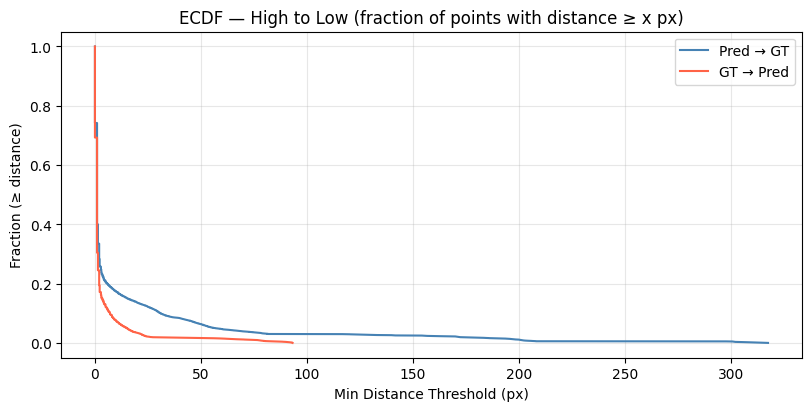

In [20]:
from neural_reconstruction.core.evaluation import compute_point_min_distances

min_pred_to_gt, min_gt_to_pred = compute_point_min_distances(pred_points, gt_points)

fig, axes = plt.subplots(1, 2, figsize=(14, 5), constrained_layout=True)

BINS = 50

for ax, dists, label, color in [
    (axes[0], min_pred_to_gt, 'Pred → GT', 'steelblue'),
    (axes[1], min_gt_to_pred, 'GT → Pred', 'tomato'),
]:
    counts, edges = np.histogram(dists, bins=BINS)
    # Sort bins from high to low distance
    centers = (edges[:-1] + edges[1:]) / 2
    order   = np.argsort(centers)[::-1]
    ax.bar(range(BINS), counts[order], color=color, edgecolor='white', linewidth=0.4)
    ax.set_xticks(range(0, BINS, 5))
    ax.set_xticklabels([f'{centers[order][i]:.1f}' for i in range(0, BINS, 5)], rotation=45, ha='right')
    ax.set_xlabel('Min Distance (px)  ← High to Low')
    ax.set_ylabel('Count')
    ax.set_title(f'{label}\n'
                 f'mean={np.mean(dists):.2f}  median={np.median(dists):.2f}  '
                 f'max={np.max(dists):.2f}  px')

fig.suptitle('Min Distance Distribution to Opposite Point Set (High to Low)', fontsize=13)
plt.show()

# ECDF — useful for checking what fraction of points have error within a threshold
fig, ax = plt.subplots(figsize=(8, 4), constrained_layout=True)
for dists, label, color in [
    (min_pred_to_gt, 'Pred → GT', 'steelblue'),
    (min_gt_to_pred, 'GT → Pred', 'tomato'),
]:
    sorted_d = np.sort(dists)[::-1]          # High to low
    ecdf     = np.arange(1, len(sorted_d)+1) / len(sorted_d)
    ax.plot(sorted_d, ecdf, label=label, color=color)

ax.set_xlabel('Min Distance Threshold (px)')
ax.set_ylabel('Fraction (≥ distance)')
ax.set_title('ECDF — High to Low (fraction of points with distance ≥ x px)')
ax.legend()
ax.grid(True, alpha=0.3)
plt.show()

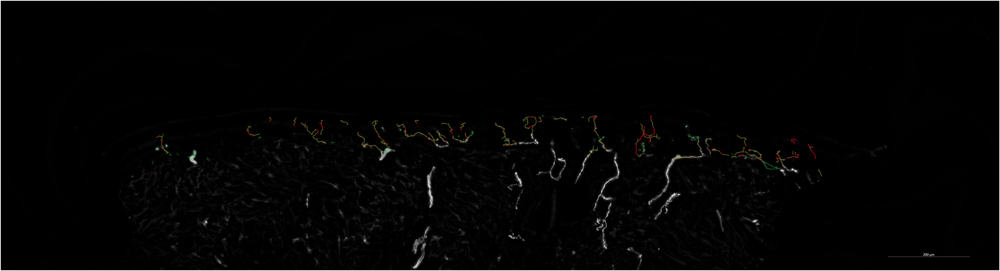

In [21]:
fig, axes = plt.subplots(1, 1, figsize=(128, 128), constrained_layout=True)

# axes[0].imshow(image, cmap='gray')
# axes[0].imshow(np.ma.masked_where(annotation == 0, annotation), cmap='Reds', alpha=0.7)
# axes[0].set_title('原始 Annotation')
# axes[0].axis('off')

draw_mst_on_ax(axes, image, gt_graph, edge_color='red', node_color='magenta',
               linewidth=4, node_size=1)
draw_mst_on_ax(axes, image, res_graph,linewidth=2, node_size=1)

axes.axis('off')
plt.savefig('mst_comparison.png')
plt.show()

In [22]:
from neural_reconstruction.core.crosses_detection import RegionLabeler, SegmentDetector, CrossingCounter
from collections import defaultdict

region_labeler = RegionLabeler()
segment_detector = SegmentDetector()
crossing_counter = CrossingCounter()

# Step 1: Detect segments (must run before RegionLabeler — segment_id is needed by label_topology)
segmented_graph = segment_detector.detect_segments(res_graph)

# Step 1b: Remove short stub segments (total path length < 5 px, with at least one endpoint)
def _path_length(data, u, v):
    path = data.get('path', [u, v])
    return len(path) - 1  # number of pixel steps

seg_edges = defaultdict(list)
for u, v, data in segmented_graph.edges(data=True):
    seg_id = data.get('segment_id')
    if seg_id is not None:
        seg_edges[seg_id].append((u, v, data))

edges_to_remove = []
for seg_id, edges in seg_edges.items():
    # Collect boundary nodes of this segment
    boundary_nodes = set()
    for u, v, _ in edges:
        if segmented_graph.nodes[u].get('node_type') in ('endpoint', 'branchpoint'):
            boundary_nodes.add(u)
        if segmented_graph.nodes[v].get('node_type') in ('endpoint', 'branchpoint'):
            boundary_nodes.add(v)

    # Only prune if at least one boundary node is an endpoint (dangling stub)
    has_endpoint = any(
        segmented_graph.nodes[n].get('node_type') == 'endpoint'
        for n in boundary_nodes
    )
    if not has_endpoint:
        continue

    total_length = sum(_path_length(data, u, v) for u, v, data in edges)
    if total_length < 5:
        edges_to_remove.extend((u, v) for u, v, _ in edges)

segmented_graph.remove_edges_from(edges_to_remove)
segmented_graph.remove_nodes_from(list(nx.isolates(segmented_graph)))
print(f'Pruned {len(edges_to_remove)} stub edges → '
      f'{segmented_graph.number_of_nodes()} nodes, {segmented_graph.number_of_edges()} edges')

# Step 2: Label regions and mark crossing edges
labeled_graph, _ = region_labeler.label_topology(segmented_graph, mask)

# Step 3: Count effective crossings
result = crossing_counter.count_effective_crossings(labeled_graph)

print(crossing_counter.get_crossing_summary(result))

Pruned 225 stub edges → 2350 nodes, 2266 edges
=== Nerve Fiber Crossing Summary ===
Total segments:              393
Segments with crossings:     35
Total crossing edges (raw):  38
Effective crossings (dedup): 35


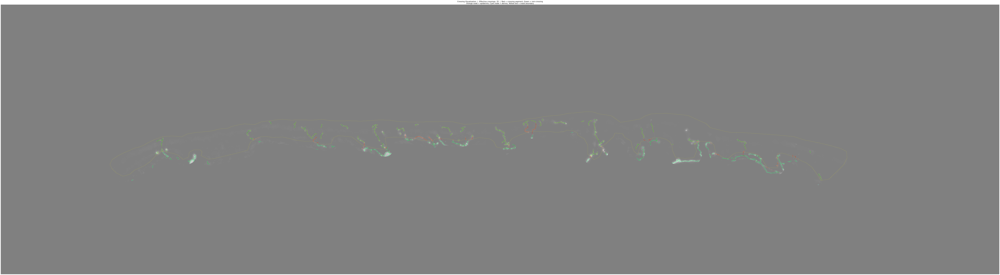

In [23]:
fig, ax = plt.subplots(1, 1, figsize=(128, 128), constrained_layout=True)

# Base image
viz_image = cv2.cvtColor(roi_image, cv2.COLOR_GRAY2RGB)

# Collect crossing segment IDs
crossing_seg_ids = {
    d['segment_id'] 
    for d in result['segment_details']
    if d['has_crossing']
}

# Draw all edges, coloured by crossing status
for u, v, data in labeled_graph.edges(data=True):
    path = data.get('path', [u, v])
    if len(path) < 2:
        continue
    xs = [p[1] for p in path]
    ys = [p[0] for p in path]
    is_crossing_seg = data.get('segment_id') in crossing_seg_ids
    color = 'red' if is_crossing_seg else 'lime'
    ax.plot(xs, ys, color=color, linewidth=1.5, alpha=0.85)

# Draw nodes
for node in labeled_graph.nodes():
    region = labeled_graph.nodes[node].get('region', 'dermis')
    color = 'orange' if region == 'epidermis' else 'cyan'
    ax.plot(node[1], node[0], '.', color=color, markersize=1.5)

# Overlay epidermis mask boundary
mask_edge = cv2.Canny(mask, 50, 150)
ys_edge, xs_edge = np.where(mask_edge > 0)
ax.scatter(xs_edge, ys_edge, s=0.3, c='yellow', linewidths=0)

ax.imshow(viz_image, alpha=0.5)
ax.set_title(
    f'Crossing Visualization  |  '
    f'Effective crossings: {result["effective_crossing_count"]}  |  '
    f'Red = crossing segment, Green = non-crossing\n'
    f'Orange node = epidermis, Cyan node = dermis, Yellow line = mask boundary',
    fontsize=16
)
ax.axis('off')
plt.savefig('crossing_visualization.png', dpi=72, bbox_inches='tight')
# plt.show()